In [3]:
pip install lightgbm


     ---------------------------------------- 1.0/1.0 MB 356.5 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [115]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from itertools import product
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_log_error as msle
from statsmodels.graphics import tsaplots
import lightgbm as lgb

import csv

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

### Read all datasets

In [5]:
train = pd.read_csv('train.csv')

In [6]:
test = pd.read_csv('test.csv')

In [7]:
transaction = pd.read_csv('transactions.csv')

In [8]:
stores = pd.read_csv('stores.csv')

In [9]:
oil_csv = pd.read_csv('oil.csv')

In [10]:
holiday = pd.read_csv('holidays_events.csv')

### Data Exploration

This is to help understand the data and give an idea on the type of models to use

#### Train

Objectives:

* Sales trend & item promotions across all product family and stores
* Sales trend & item promotions across all stores for each product family and store
* Which product family generates the most sales?
* Compare sales over various periods (months, seasons)



In [11]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [12]:
train.drop(columns=['id'], inplace=True)

In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 5 columns):
 #   Column       Dtype  
---  ------       -----  
 0   date         object 
 1   store_nbr    int64  
 2   family       object 
 3   sales        float64
 4   onpromotion  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 114.5+ MB


In [14]:
print(f'Sales Duration (Training Data): {train.date.min()} to {train.date.max()}')

Sales Duration (Training Data): 2013-01-01 to 2017-08-15


In [15]:
# Number of dates in training data
train.date.nunique()

1684

In [16]:
train['date'] = pd.to_datetime(train['date'])

In [17]:
# Number of days from date range
(train.date.max() - train.date.min()).days + 1

1688

In [18]:
# Check missing dates
missing_date_list = pd.date_range(start='2013-01-01', end='2017-08-15').difference(train.date.unique())
print(missing_date_list)

DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]', freq=None)


In [28]:
missing_data = pd.DataFrame(list(product(*[train.store_nbr.unique(), 
                              train.family.unique(), 
                              missing_date_list]
                           )
                   ), columns=['store_nbr', 'family', 'date'])

In [29]:
missing_data.head()

,store_nbr,family,date
0,1,AUTOMOTIVE,2013-12-25
1,1,AUTOMOTIVE,2014-12-25
2,1,AUTOMOTIVE,2015-12-25
3,1,AUTOMOTIVE,2016-12-25
4,1,BABY CARE,2013-12-25


In [26]:
train = train.append(missing_data)

In [27]:
train.fillna(0, inplace=True)

In [30]:
# Number of stores
train.store_nbr.nunique()

54

In [ ]:
# Number of product families
train.family.nunique()

33

In [ ]:
for column in ['sales', 'onpromotion']:
    print(f'FULL STATS FIGURES: {column.upper()}')
    print(f'MIN: {train[column].min()}')
    print(f'25 QUANTILE: {train[column].quantile(0.25)}')
    print(f'50 QUANTILE: {train[column].quantile(0.5)}')
    print(f'MEAN: {train[column].mean()}')
    print(f'75 QUANTILE: {train[column].quantile(0.75)}')
    print(f'MAX: {train[column].max()}\n')

FULL STATS FIGURES: SALES
MIN: 0.0
25 QUANTILE: 0.0
50 QUANTILE: 11.0
MEAN: 356.92793928059854
75 QUANTILE: 195.0
MAX: 124717.0

FULL STATS FIGURES: ONPROMOTION
MIN: 0.0
25 QUANTILE: 0.0
50 QUANTILE: 1.0
MEAN: 34.520889848990166
75 QUANTILE: 16.0
MAX: 1006.0



In [31]:
train.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3015144 entries, 0 to 7127
Data columns (total 5 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   date         3015144 non-null  datetime64[ns]
 1   store_nbr    3015144 non-null  int64         
 2   family       3015144 non-null  object        
 3   sales        3015144 non-null  float64       
 4   onpromotion  3015144 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(1)
memory usage: 138.0+ MB


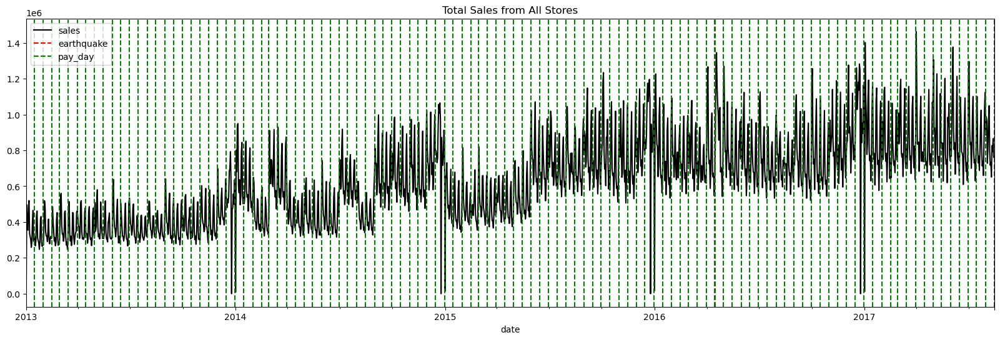

In [32]:
earthquake = [pd.to_datetime('2016-04-16')]
pay_day = pd.date_range(start=train.date.min(), end=train.date.max(), freq='SM').astype('str').tolist()
ax = train.groupby(['date'], as_index=False)['sales'].sum().plot(
    'date', 'sales', figsize=(20,6), title='Total Sales from All Stores', color='black')
ax.axvline(earthquake, color='red', linestyle='--')

for date in pay_day:
    ax.axvline(date, color='green', linestyle='--')
ax.legend(['sales', 'earthquake', 'pay_day'])

From the data we already know there were no sales on 25-December of each year.

From the graph the next day with least sales might have been on the last day of each year (31-December) or the 1st day of each year (1st January).

Also pay day might have some effect on sales.

In [33]:
# Find dates where total sales were 0 or the least value (25-12 from 2013-2017 - and another day?)
grouped = train.groupby(['date'], as_index=False)['sales'].sum()

without_0 = grouped[~(grouped['date'].isin(missing_date_list))]

without_0['year'] = without_0['date'].dt.year

min_sales = without_0.groupby(['year'], as_index=False)['sales'].min()

merged = without_0.merge(min_sales, how='left', on='year')

merged[merged['sales_x'] == merged['sales_y']]

,date,sales_x,year,sales_y
0,2013-01-01,2511.618999,2013,2511.618999
364,2014-01-01,8602.065404,2014,8602.065404
728,2015-01-01,12773.616980,2015,12773.616980
1092,2016-01-01,16433.394000,2016,16433.394000
1457,2017-01-01,12082.500997,2017,12082.500997


Confirmed: Sales are generally lower on 1st January every year. This could be due to the stores not being open for long (need more info from stores to make this conclusion)

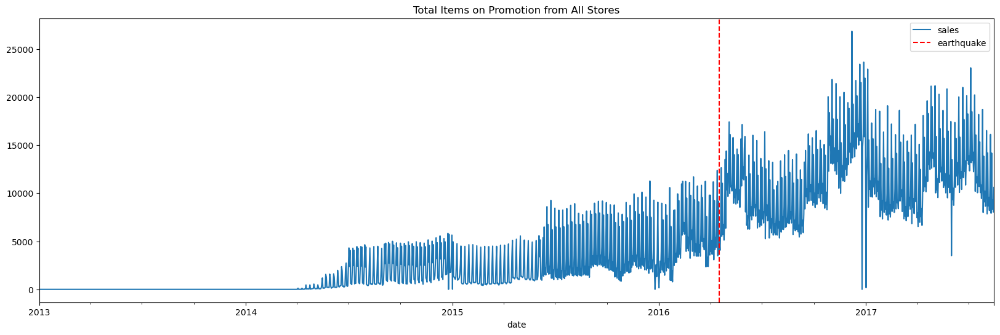

In [35]:
ax = train.groupby(['date'], as_index=False)['onpromotion'].sum().plot(
    'date', 'onpromotion', figsize=(20,6), title='Total Items on Promotion from All Stores')
ax.axvline(earthquake, color='red', linestyle='--')
ax.legend(['sales', 'earthquake'])

25-Dec and 1-Jan seem to have the same effect on the number of items promoted (fewer or no items are promoted on those dates). Also the earthquake does not seem to have an overall effect on the number of items on promotion

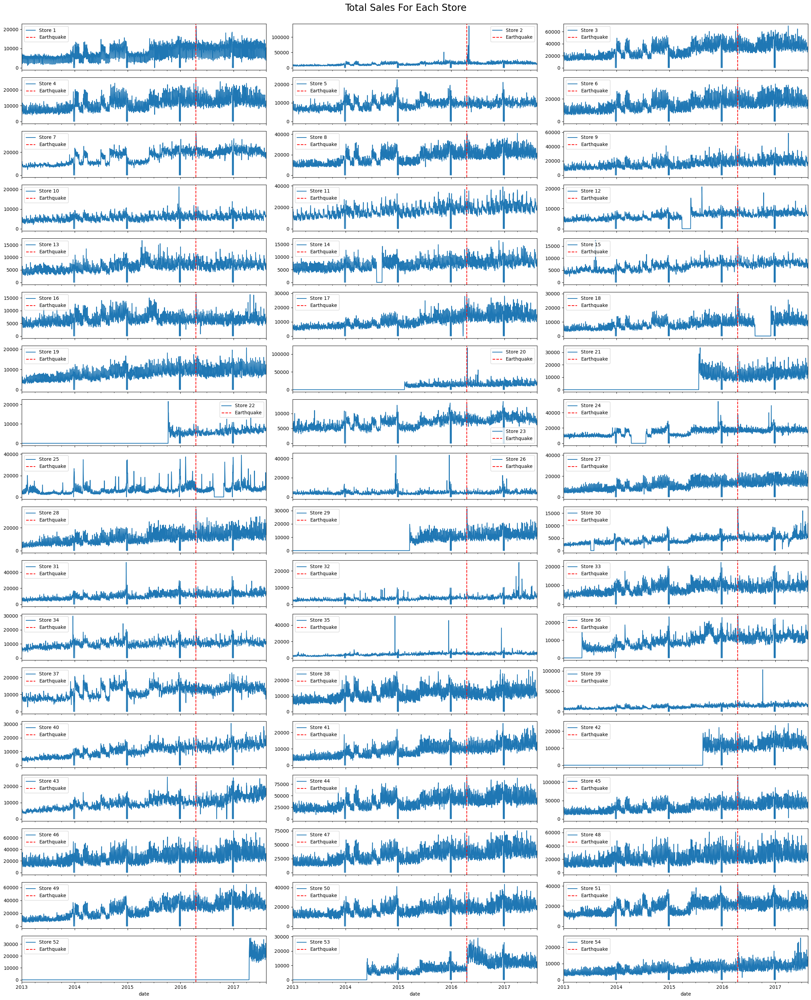

In [36]:
nrows, ncols = int(np.ceil(train.store_nbr.nunique()/3)), 3
fig, axs = plt.subplots(nrows, ncols, figsize=(24, 30), sharex=True, sharey=False)
axes = axs.ravel()
plot = 0

fig.suptitle('Total Sales For Each Store', fontsize=20)

for name, group in train.groupby('store_nbr'):
    group.groupby(['date'], as_index=False)['sales'].sum().plot('date', 'sales', ax=axes[plot])
    axes[plot].axvline(earthquake, color='red', linestyle='--')
    axes[plot].legend([f'Store {name}', 'Earthquake'])
    plot += 1
    
fig.add_gridspec(hspace=2)
fig.tight_layout()
fig.subplots_adjust(top=0.96)

From the graphs above, sales for Store 53 had a substantial increase after the earthquake and continued to increase for some time. Other stores that had a sudden spike in sales after the earthquake include: Stores 1, 2, 7, 15, 16, 18, 20, 24, 28, 29, 30, 43, 45, 51.

These stores did not start operating till some time after 2014: Stores 20, 21, 22, 29, 42, 52, 53.

These stores also might have been closed for some time: Stores 12, 18, 24.

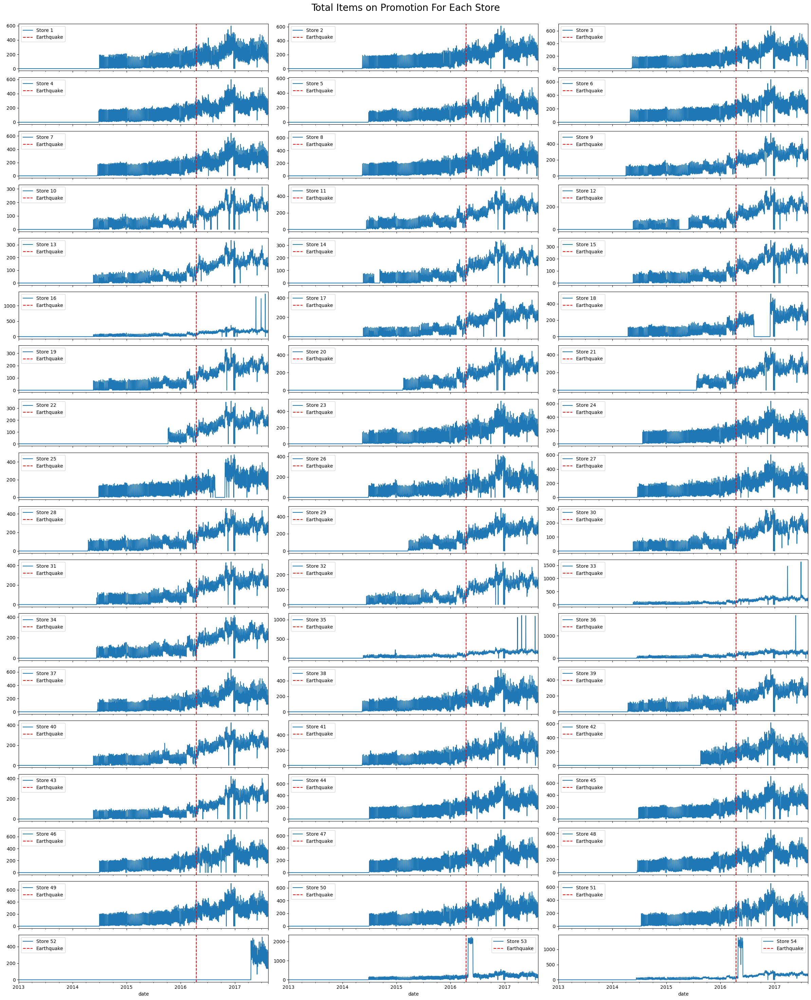

In [37]:
nrows, ncols = int(np.ceil(train.store_nbr.nunique()/3)), 3
fig, axs = plt.subplots(nrows, ncols, figsize=(24, 30), sharex=True, sharey=False)
axes = axs.ravel()
plot = 0

fig.suptitle('Total Items on Promotion For Each Store', fontsize=20)

for name, group in train.groupby('store_nbr'):
    group.groupby(['date'], as_index=False)['onpromotion'].sum().plot('date', 'onpromotion', ax=axes[plot])
    axes[plot].axvline(earthquake, color='red', linestyle='--')
    axes[plot].legend([f'Store {name}', 'Earthquake'])
    plot += 1
    
fig.add_gridspec(hspace=2)
fig.tight_layout()
fig.subplots_adjust(top=0.96)

The trend of items promoted seems similar across all stores except for cases where the stores might have been closed or not yet opened. Only Store 53 seems to be affected by the earthquake - the store could be located in the city or state where the earthquake took place.


From the sales and promotion graphs Store 53 had a boost in sales and promotion after the earthquake, thus a new feature would have to be included to help the model understand this.

<b>Assumption for feature engineering:</b>

The increase in sales caused by the earthquake lasted till the end of the year.

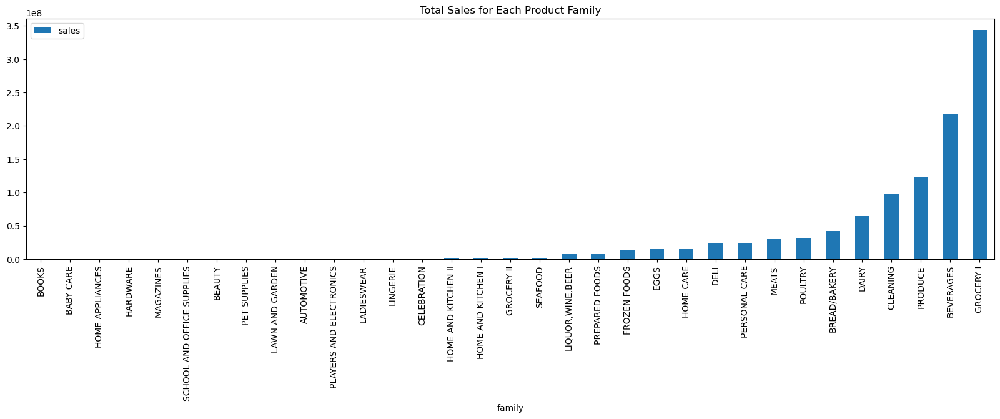

In [38]:
ax = train.groupby(['family'], as_index=False)['sales'].sum().sort_values('sales')\
                                    .plot('family', 'sales', kind='bar', figsize=(20,5), 
                                          title='Total Sales for Each Product Family')

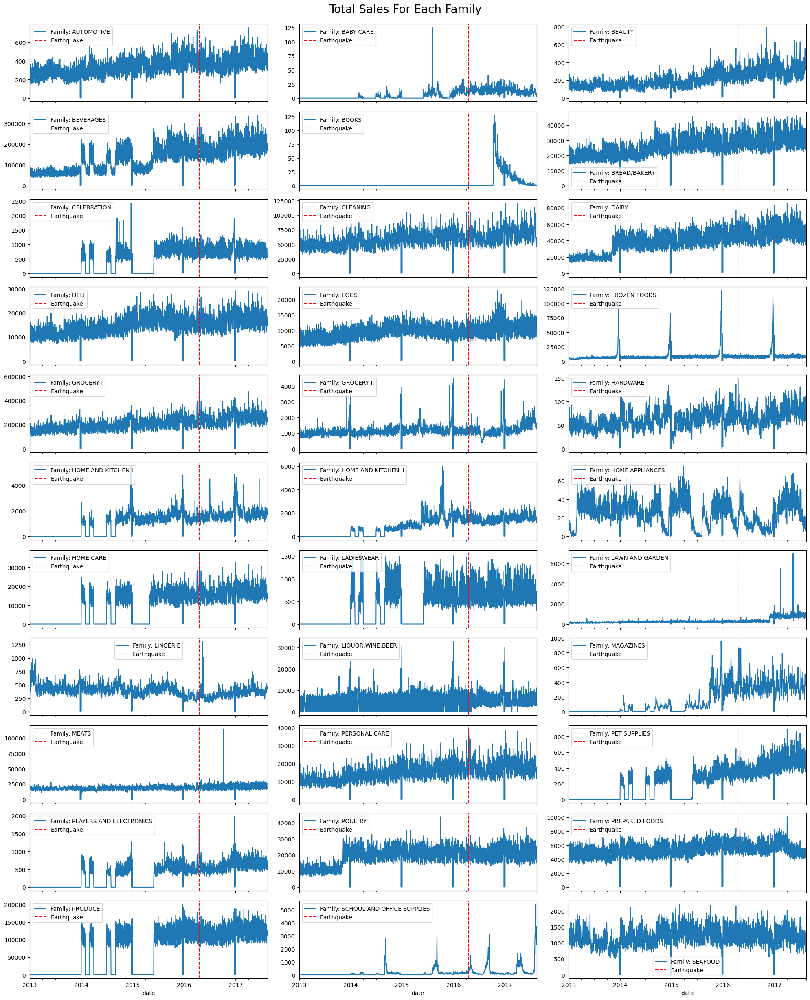

In [39]:
nrows, ncols = int(np.ceil(train.family.nunique()/3)), 3
fig, axs = plt.subplots(nrows, ncols, figsize=(20, 25), sharex=True, sharey=False)
axes = axs.ravel()
plot = 0

fig.suptitle('Total Sales For Each Family', fontsize=20)

for name, group in train.groupby('family'):
    group.groupby(['date'], as_index=False)['sales'].sum().plot('date', 'sales', ax=axes[plot])
    axes[plot].axvline(earthquake, color='red', linestyle='--')
    axes[plot].legend([f'Family: {name}', 'Earthquake'])
    plot += 1
    
fig.add_gridspec(hspace=2)
fig.tight_layout()
fig.subplots_adjust(top=0.96)

Products that were affected by the earthquake (products that saw sales spikes after the earthquake): 

Grocery I, Lingerie, School and Office Supplies, Players and Electronics, Personal Care, Magazines, Hardware, Home Care

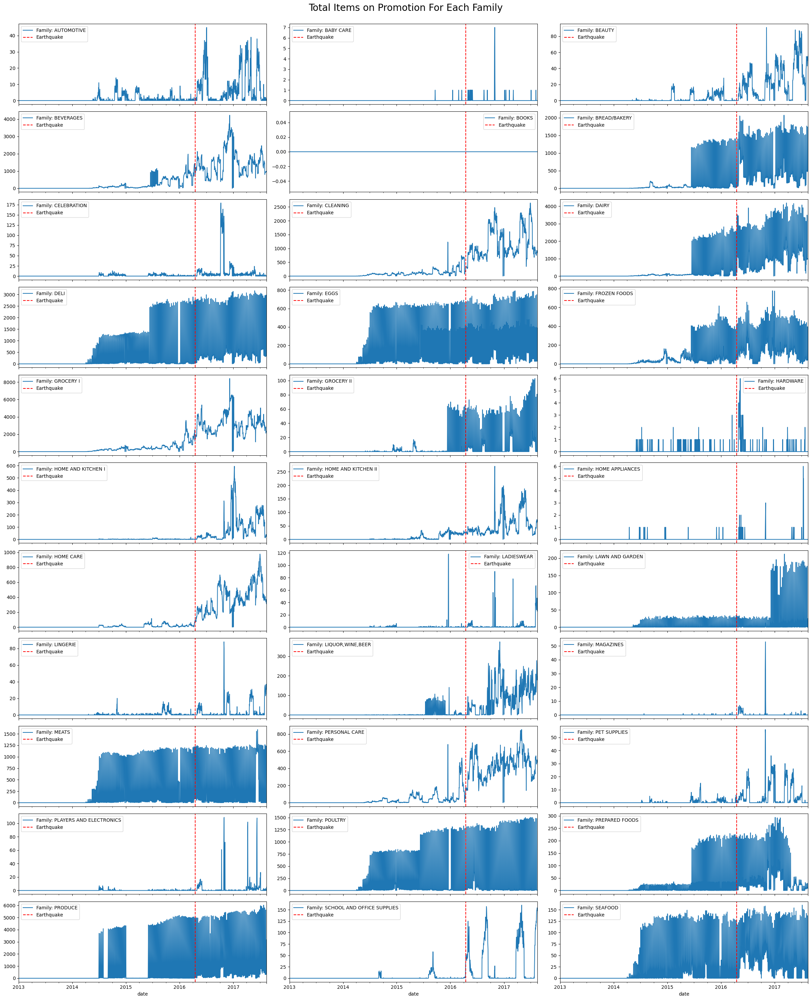

In [40]:
nrows, ncols = int(np.ceil(train.family.nunique()/3)), 3
fig, axs = plt.subplots(nrows, ncols, figsize=(24, 30), sharex=True, sharey=False)
axes = axs.ravel()
plot = 0

fig.suptitle('Total Items on Promotion For Each Family', fontsize=20)

for name, group in train.groupby('family'):
    group.groupby(['date'], as_index=False)['onpromotion'].sum().plot('date', 'onpromotion', ax=axes[plot])
    axes[plot].axvline(earthquake, color='red', linestyle='--')
    axes[plot].legend([f'Family: {name}', 'Earthquake'])
    plot += 1
    
fig.add_gridspec(hspace=2)
fig.tight_layout()
fig.subplots_adjust(top=0.96)

Unlike the promotions made across shops, far less products across the product family share the same trend. 

The Lawn and Garden product family is the most notable product with a significant increase in item promotion before 25-Dec-2017.

The promotion of school and office supplies were significantly increased after the earthquake while the promotion of liquor, wine, beer and beverages saw a drop in promotion after the earthquake.

In [41]:
def getDateFeatures(df, date):
    df['date'] = pd.to_datetime(df[date])
    df['month'] = df['date'].dt.month
    df['day_of_month'] = df['date'].dt.day
    df['day_of_year'] = df['date'].dt.dayofyear
    df['week_of_year'] = df['date'].dt.isocalendar().week
    df['day_of_week'] = df['date'].dt.dayofweek
    df['year'] = df['date'].dt.year
    df["is_weekend"] = np.where(df['day_of_week'] > 4, 1, 0)
    df['is_month_start'] = df['date'].dt.is_month_start.astype(int)
    df['is_month_end'] = df['date'].dt.is_month_end.astype(int)
    df['quarter'] = df['date'].dt.quarter
    df['is_quarter_start'] = df['date'].dt.is_quarter_start.astype(int)
    df['is_quarter_end'] = df['date'].dt.is_quarter_end.astype(int)
    df['is_year_start'] = df['date'].dt.is_year_start.astype(int)
    df['is_year_end'] = df['date'].dt.is_year_end.astype(int)
    
    return df

In [42]:
train_df = getDateFeatures(train, 'date')

In [43]:
# 0 = dry season, 1 = rainy season
train_df['season'] = np.where(train_df['month'].isin([6,7,8,9]), 1, 0)

In [44]:
train_df['pay_day'] = np.where(train_df['date'].isin(pay_day), 1, 0)

In [45]:
# 1 if date falls in somewhere from earthquake date (16-April-2016) to end of year date (31-December-2016)
# This is based on my assumption that the effect of the earthquake lasted till the end of that year
train_df['earthquake_impact'] = np.where(train_df['date'].isin(
    pd.date_range(start='2016-04-16', end='2016-12-31', freq='D')),
                                    1, 0)

In [46]:
train_df.head()

,date,store_nbr,family,sales,onpromotion,month,day_of_month,day_of_year,week_of_year,day_of_week,...,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,pay_day,earthquake_impact
0,2013-01-01,1,AUTOMOTIVE,0.0,0.0,1,1,1,1,1,...,1,0,1,1,0,1,0,0,0,0
1,2013-01-01,1,BABY CARE,0.0,0.0,1,1,1,1,1,...,1,0,1,1,0,1,0,0,0,0
2,2013-01-01,1,BEAUTY,0.0,0.0,1,1,1,1,1,...,1,0,1,1,0,1,0,0,0,0
3,2013-01-01,1,BEVERAGES,0.0,0.0,1,1,1,1,1,...,1,0,1,1,0,1,0,0,0,0
4,2013-01-01,1,BOOKS,0.0,0.0,1,1,1,1,1,...,1,0,1,1,0,1,0,0,0,0


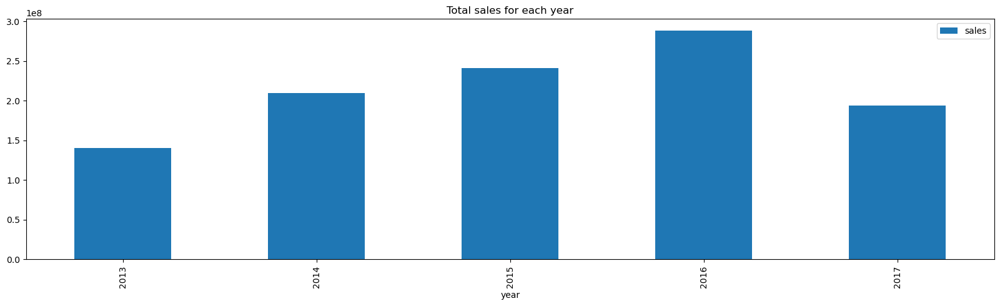

In [47]:
ax = train_df.groupby(['year'], as_index=False)['sales'].sum()\
                                    .plot('year', 'sales', kind='bar', figsize=(20,5),
                                         title='Total sales for each year')

Sales increase over the years from 2013 to 2016. The sales in 2017 does not follow this trend probably because the data for that year does not cover a whole year.

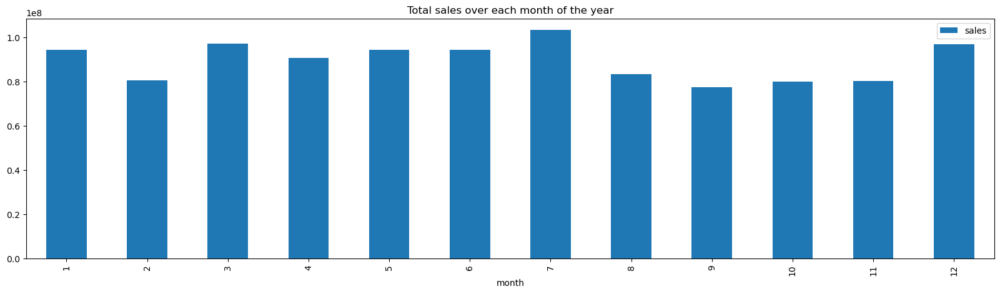

In [48]:
ax = train_df.groupby(['month'], as_index=False)['sales'].sum()\
                                    .plot('month', 'sales', kind='bar', figsize=(20,5),
                                         title='Total sales over each month of the year')

Sales for months 8 to 11 (August to November) and 2 (February) are the lowest throughout the year with January, March, July and December (1, 3, 7, 12) having the highest sales.

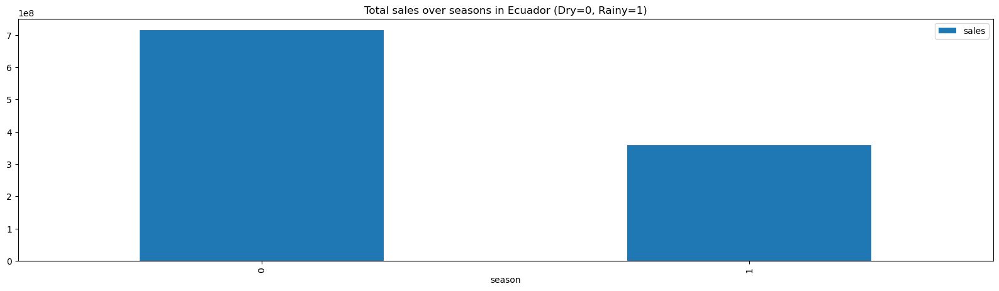

In [49]:
ax = train_df.groupby(['season'], as_index=False)['sales'].sum()\
                                    .plot('season', 'sales', kind='bar', figsize=(20,5),
                                         title='Total sales over seasons in Ecuador (Dry=0, Rainy=1)')

The drop in sales from August to November also reflects here. Thus sales are generally lower during the rainy season.

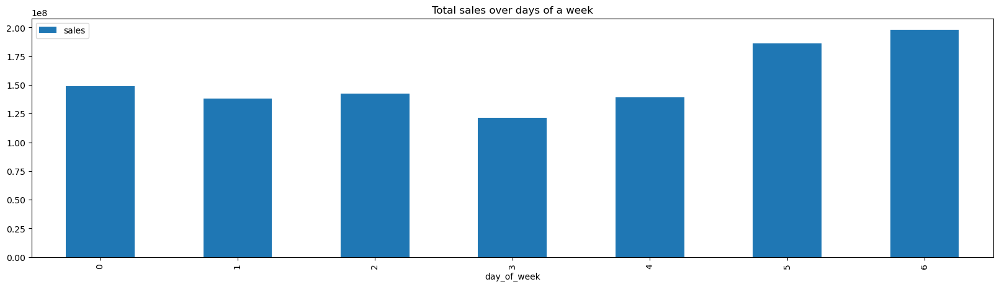

In [50]:
ax = train_df.groupby(['day_of_week'], as_index=False)['sales'].sum()\
                                    .plot('day_of_week', 'sales', kind='bar', figsize=(20,5),
                                         title='Total sales over days of a week')

The overall sales are higher on the weekends.

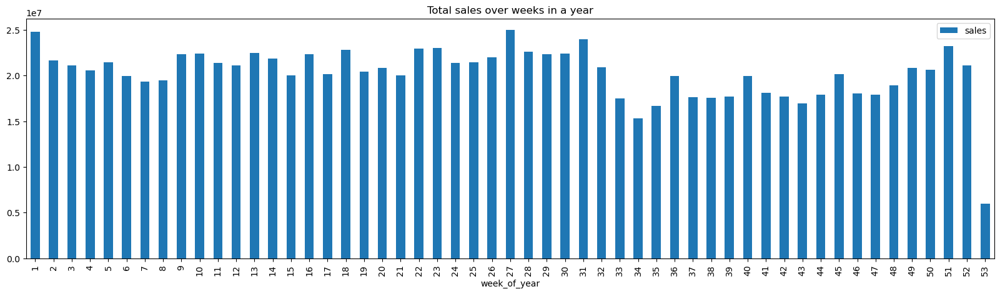

In [51]:
ax = train_df.groupby(['week_of_year'], as_index=False)['sales'].sum()\
                                    .plot('week_of_year', 'sales', kind='bar', figsize=(20,5),
                                         title='Total sales over weeks in a year')

Sales are highest during week 1 and 27 (1st week and mid week of the year).

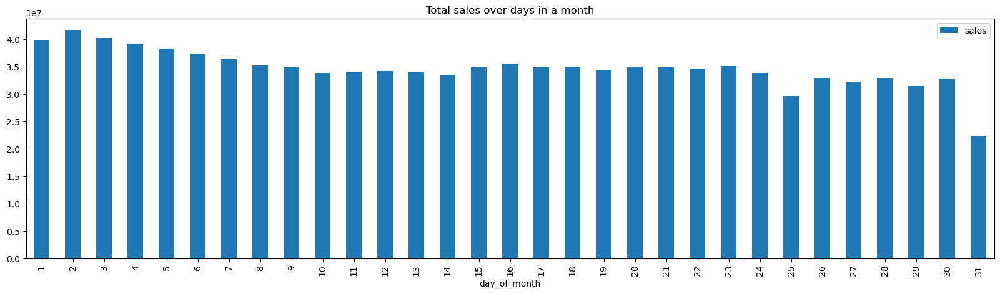

In [52]:
ax = train_df.groupby(['day_of_month'], as_index=False)['sales'].sum()\
                                    .plot('day_of_month', 'sales', kind='bar', figsize=(20,5),
                                         title='Total sales over days in a month')

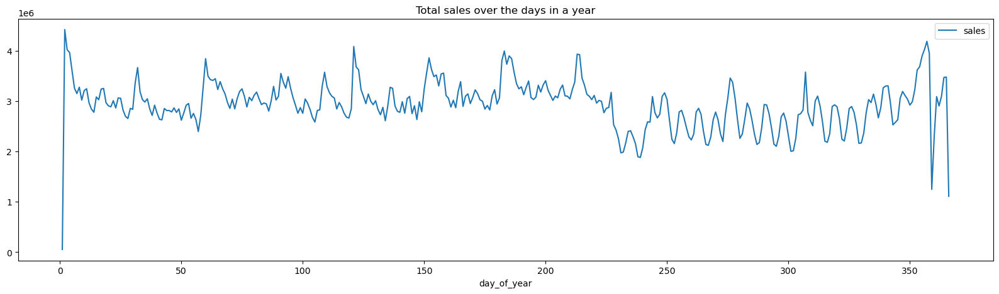

In [53]:
ax = train_df.groupby(['day_of_year'], as_index=False)['sales'].sum()\
                                    .plot('day_of_year', 'sales', figsize=(20,5),
                                         title='Total sales over the days in a year')

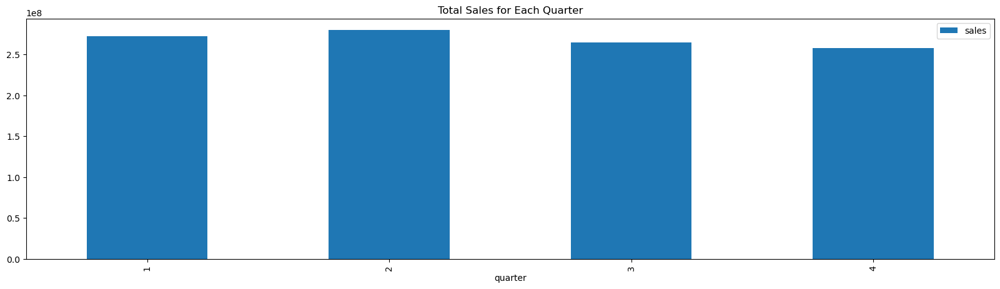

In [54]:
ax = train_df.groupby(['quarter'], as_index=False)['sales'].sum()\
                                    .plot('quarter', 'sales', kind='bar', figsize=(20,5),
                                         title='Total Sales for Each Quarter')

Sales are higher in the first and second quarters of the year. The difference might be partially from the data not being complete for the last year (2017).

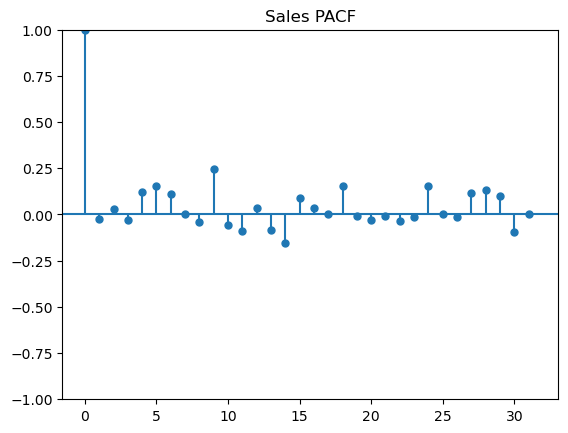

In [127]:
# Check partial autocorrelation to know if previous sales numbers affect the current sales
pacf = tsaplots.plot_pacf(train_df[['sales']], lags=31, title = 'Sales PACF', method="ywm")

Sales from 5, 6, 7, 10, 15, 19, 25, 28, 29, 30 days ago possibly have an effect on the current sales. This would have to be confirmed with the number of transactions, holidays or promotions to be sure of the effect. For now these days would be considered for lag or moving average calculations for better forecasts.

#### Test

In [56]:
test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [128]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           28512 non-null  int64 
 1   date         28512 non-null  object
 2   store_nbr    28512 non-null  int64 
 3   family       28512 non-null  object
 4   onpromotion  28512 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.1+ MB


In [57]:
print(f'Sales Duration (Test Data): {test.date.min()} to {test.date.max()}')

Sales Duration (Test Data): 2017-08-16 to 2017-08-31


In [58]:
print(f'FULL STATS FIGURES: ONPROMOTION')
print(f'MIN: {test["onpromotion"].min()}')
print(f'25 QUANTILE: {test["onpromotion"].quantile(0.25)}')
print(f'50 QUANTILE: {test["onpromotion"].quantile(0.5)}')
print(f'MEAN: {test["onpromotion"].mean()}')
print(f'75 QUANTILE: {test["onpromotion"].quantile(0.75)}')
print(f'MAX: {test["onpromotion"].max()}')

FULL STATS FIGURES: ONPROMOTION
MIN: 0
25 QUANTILE: 0.0
50 QUANTILE: 0.0
MEAN: 6.9653829966329965
75 QUANTILE: 6.0
MAX: 646


#### Transactions

* Trend of transactions over time

In [59]:
transaction.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [60]:
transaction.describe()

,store_nbr,transactions
count,83488.000000,83488.000000
mean,26.939237,1694.602158
std,15.608204,963.286644
min,1.000000,5.000000
25%,13.000000,1046.000000
50%,27.000000,1393.000000
75%,40.000000,2079.000000
max,54.000000,8359.000000


In [61]:
transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          83488 non-null  object
 1   store_nbr     83488 non-null  int64 
 2   transactions  83488 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.9+ MB


In [62]:
print(f'Transaction Duration: {transaction.date.min()} to {transaction.date.max()}')

Transaction Duration: 2013-01-01 to 2017-08-15


In [63]:
transaction['date'] = pd.to_datetime(transaction['date'])

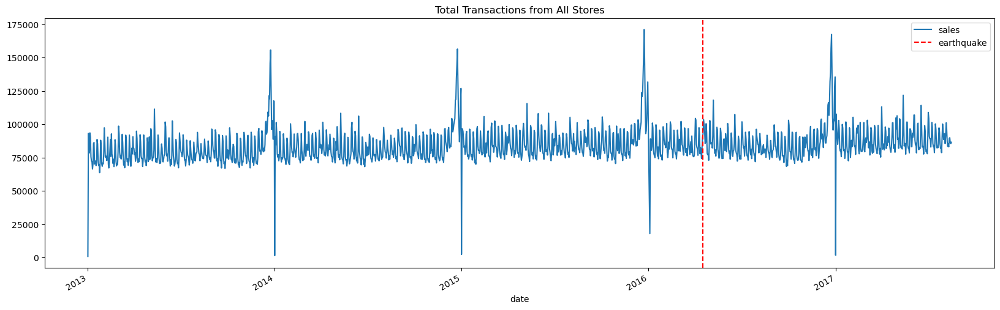

In [64]:
ax = transaction.groupby(['date'], as_index=False)['transactions'].sum().plot(
    'date', 'transactions', figsize=(20,6), title='Total Transactions from All Stores')
ax.axvline(earthquake, color='red', linestyle='--')
ax.legend(['sales', 'earthquake'])

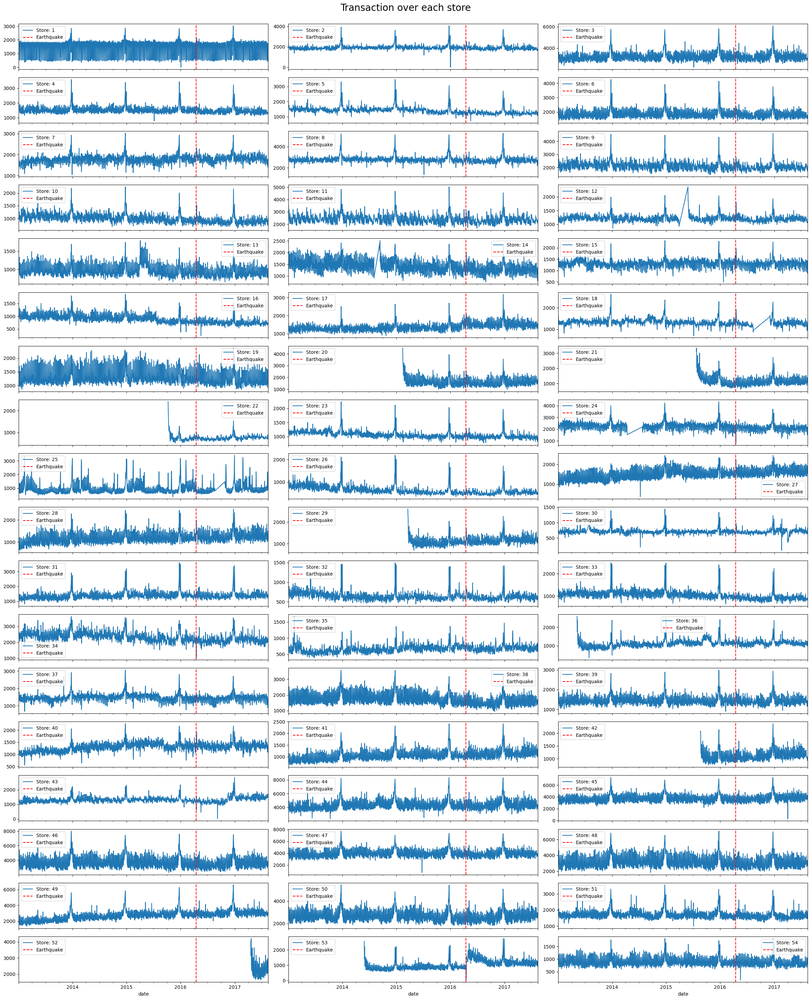

In [65]:
nrows, ncols = int(np.ceil(transaction.store_nbr.nunique()/3)), 3
fig, axs = plt.subplots(nrows, ncols, figsize=(24, 30), sharex=True, sharey=False)
axes = axs.ravel()
plot = 0

fig.suptitle('Transaction over each store', fontsize=20)

for name, group in transaction.groupby('store_nbr'):
    group.groupby(['date'], as_index=False)['transactions'].sum().plot('date', 'transactions', ax=axes[plot])
    axes[plot].axvline(earthquake, color='red', linestyle='--')
    axes[plot].legend([f'Store: {name}', 'Earthquake'])
    plot += 1
    
fig.add_gridspec(hspace=2)
fig.tight_layout()
fig.subplots_adjust(top=0.96)

The drastic increase in sales for Store 53 after the earthquake reflects in the number of transactions that took place after the incident. This confirms that Store 53 was affected by the earthquake.

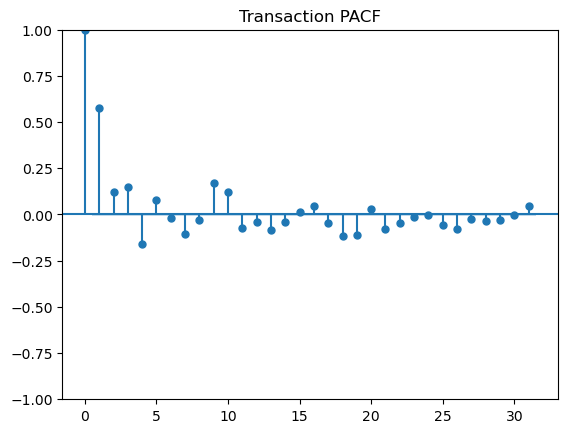

In [129]:
# Check partial autocorrelation to know if previous transaction numbers affect the current transaction numbers
pacf = tsaplots.plot_pacf(transaction[['transactions']], lags=31, title='Transaction PACF', method='ywm')

From the plot, transactions are influenced by after 1, 2, 5, 10, 11 days. Sales is also influenced from sales that took place 5 or 10 days ago. Thus, using those values for lag or moving average features might be helpful.

#### Stores

* Sales per store type, cluster, city and state
* Trend of sales for each store type, cluster, city and state

In [67]:
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [68]:
stores.describe()

,store_nbr,cluster
count,54.000000,54.000000
mean,27.500000,8.481481
std,15.732133,4.693395
min,1.000000,1.000000
25%,14.250000,4.000000
50%,27.500000,8.500000
75%,40.750000,13.000000
max,54.000000,17.000000


In [69]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [70]:
print(f'Number of Cities = {stores.city.nunique()}, Number of States = {stores.state.nunique()}, Number of Store Types = {stores.type.nunique()}, Number of Clusters = {stores.cluster.nunique()}')

Number of Cities = 22, Number of States = 16, Number of Store Types = 5, Number of Clusters = 17


In [71]:
store_data = train_df.merge(stores, how='left', on=['store_nbr'])

In [72]:
store_data.head()

,date,store_nbr,family,sales,onpromotion,month,day_of_month,day_of_year,week_of_year,day_of_week,...,is_quarter_end,is_year_start,is_year_end,season,pay_day,earthquake_impact,city,state,type,cluster
0,2013-01-01,1,AUTOMOTIVE,0.0,0.0,1,1,1,1,1,...,0,1,0,0,0,0,Quito,Pichincha,D,13
1,2013-01-01,1,BABY CARE,0.0,0.0,1,1,1,1,1,...,0,1,0,0,0,0,Quito,Pichincha,D,13
2,2013-01-01,1,BEAUTY,0.0,0.0,1,1,1,1,1,...,0,1,0,0,0,0,Quito,Pichincha,D,13
3,2013-01-01,1,BEVERAGES,0.0,0.0,1,1,1,1,1,...,0,1,0,0,0,0,Quito,Pichincha,D,13
4,2013-01-01,1,BOOKS,0.0,0.0,1,1,1,1,1,...,0,1,0,0,0,0,Quito,Pichincha,D,13


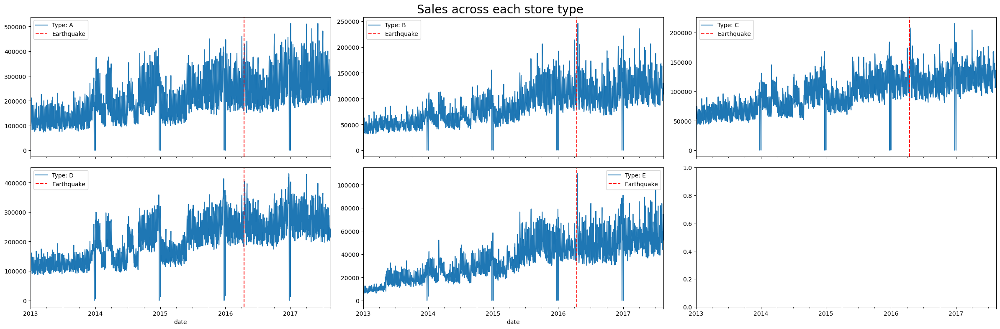

In [73]:
nrows, ncols = int(np.ceil(store_data.type.nunique()/3)), 3
fig, axs = plt.subplots(nrows, ncols, figsize=(24, 8), sharex=True, sharey=False)
axes = axs.ravel()
plot = 0

fig.suptitle('Sales across each store type', fontsize=20)

for name, group in store_data.groupby('type'):
    group.groupby(['date'], as_index=False)['sales'].sum().plot('date', 'sales', ax=axes[plot])
    axes[plot].axvline(earthquake, color='red', linestyle='--')
    axes[plot].legend([f'Type: {name}', 'Earthquake'])
    plot += 1
    
fig.add_gridspec(hspace=2)
fig.tight_layout()
fig.subplots_adjust(top=0.94)

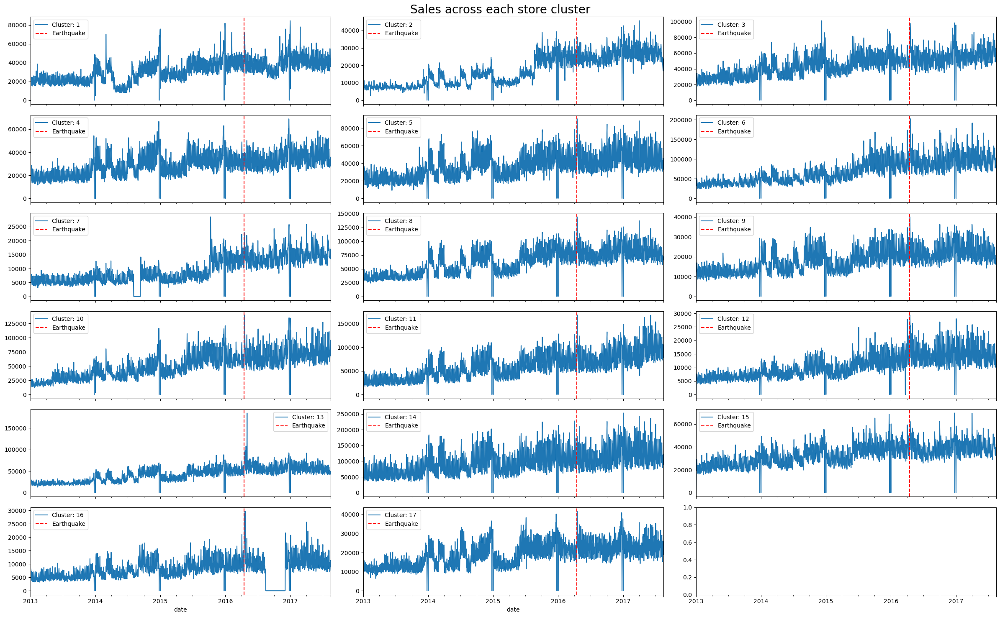

In [74]:
nrows, ncols = int(np.ceil(store_data.cluster.nunique()/3)), 3
fig, axs = plt.subplots(nrows, ncols, figsize=(24, 15), sharex=True, sharey=False)
axes = axs.ravel()
plot = 0

fig.suptitle('Sales across each store cluster', fontsize=20)

for name, group in store_data.groupby('cluster'):
    group.groupby(['date'], as_index=False)['sales'].sum().plot('date', 'sales', ax=axes[plot])
    axes[plot].axvline(earthquake, color='red', linestyle='--')
    axes[plot].legend([f'Cluster: {name}', 'Earthquake'])
    plot += 1
    
fig.add_gridspec(hspace=2)
fig.tight_layout()
fig.subplots_adjust(top=0.96)

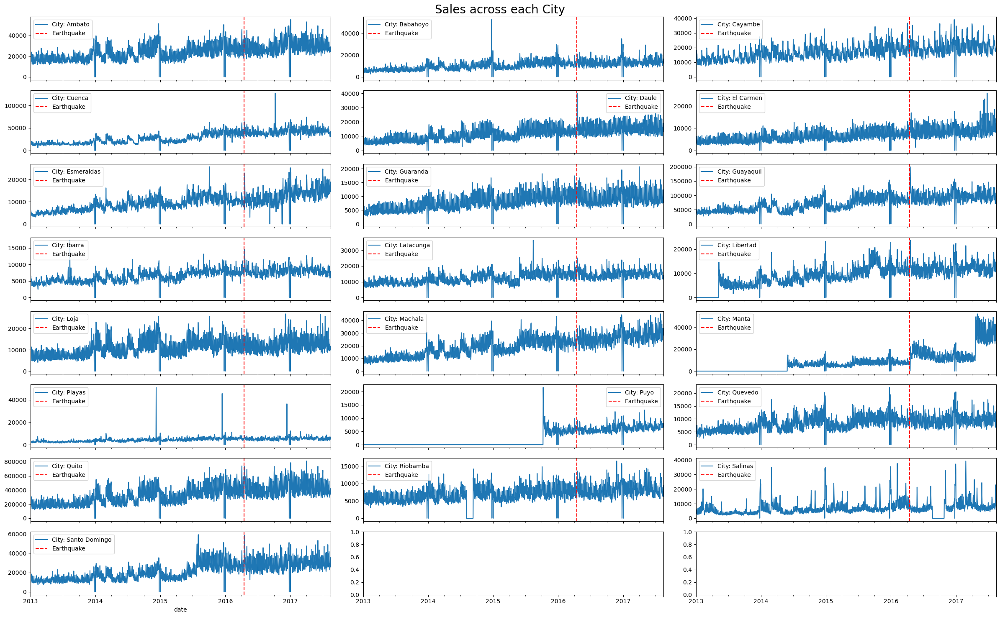

In [75]:
nrows, ncols = int(np.ceil(store_data.city.nunique()/3)), 3
fig, axs = plt.subplots(nrows, ncols, figsize=(24, 15), sharex=True, sharey=False)
axes = axs.ravel()
plot = 0

fig.suptitle('Sales across each City', fontsize=20)

for name, group in store_data.groupby('city'):
    group.groupby(['date'], as_index=False)['sales'].sum().plot('date', 'sales', ax=axes[plot])
    axes[plot].axvline(earthquake, color='red', linestyle='--')
    axes[plot].legend([f'City: {name}', 'Earthquake'])
    plot += 1
    
fig.add_gridspec(hspace=2)
fig.tight_layout()
fig.subplots_adjust(top=0.96)

The store in Manta which is on the East Coast of Ecuador was heavily affected by the earthquake; which is expected since the earthquake occured on the East Coast of Ecuador. There was another sales spike the next year in the same city. 

Some other cities that had sales spikes but for a shorter period are:

Santo Domingo, Libertad, Ibarra, Esmeraldas, Guayaquil, Daule.

From the sales axis in the Quito subplot, we can conclude that a higher volume of sales is made in that city.

To Do:

* Check number of stores in Manta.
* Confirm if any of them were opened in 2017 (Store 52)

In [76]:
stores.groupby('city').agg(num=('store_nbr', 'nunique'), stores=('store_nbr', lambda x: set(x)))

,num,stores
city,,
Ambato,2,"{50, 23}"
Babahoyo,1,{31}
Cayambe,1,{11}
Cuenca,3,"{42, 37, 39}"
Daule,1,{27}
El Carmen,1,{54}
Esmeraldas,1,{43}
Guaranda,1,{19}
Guayaquil,8,"{32, 34, 51, 24, 26, 28, 29, 30}"


<b>Confirmed</b>: Store 52 was opened in Manta and this caused the sales spike in that city in 2017.

Quito has 18 stores which explains why it has the most sales among all the other shops.

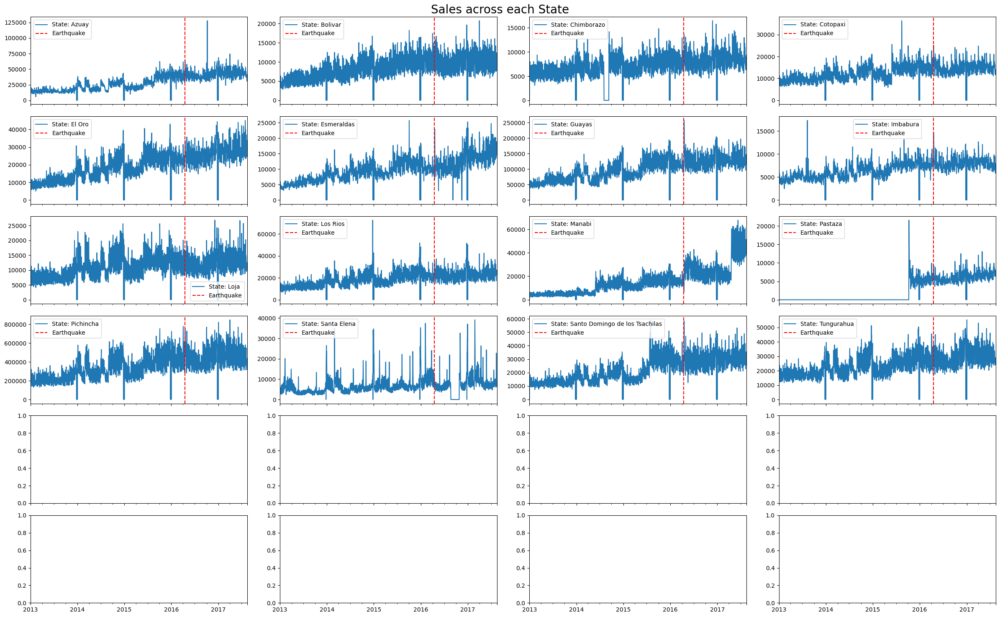

In [132]:
nrows, ncols = int(np.ceil(store_data.state.nunique()/3)), 4
fig, axs = plt.subplots(nrows, ncols, figsize=(24, 15), sharex=True, sharey=False)
axes = axs.ravel()
plot = 0

fig.suptitle('Sales across each State', fontsize=20)

for name, group in store_data.groupby('state'):
    group.groupby(['date'], as_index=False)['sales'].sum().plot('date', 'sales', ax=axes[plot])
    axes[plot].axvline(earthquake, color='red', linestyle='--')
    axes[plot].legend([f'State: {name}', 'Earthquake'])
    plot += 1
    
fig.add_gridspec(hspace=2)
fig.tight_layout()
fig.subplots_adjust(top=0.96)

#### Oil

* Trend of oil prices

In [78]:
oil_csv.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [79]:
oil_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1218 non-null   object 
 1   dcoilwtico  1175 non-null   float64
dtypes: float64(1), object(1)
memory usage: 19.2+ KB


In [80]:
print(f'Oil Date Duration: {oil_csv.date.min()} to {oil_csv.date.max()}')

Oil Date Duration: 2013-01-01 to 2017-08-31


In [81]:
# Number of dates in oil data
oil_csv.date.nunique()

1218

In [82]:
oil_csv['date'] = pd.to_datetime(oil_csv['date'])

In [83]:
# Number of days from date range
(oil_csv.date.max() - oil_csv.date.min()).days + 1

1704

In [84]:
# Check missing dates
missing_date_list_2 = pd.date_range(start='2013-01-01', end='2017-08-31').difference(oil_csv.date.unique())
print(missing_date_list_2)

DatetimeIndex(['2013-01-05', '2013-01-06', '2013-01-12', '2013-01-13',
               '2013-01-19', '2013-01-20', '2013-01-26', '2013-01-27',
               '2013-02-02', '2013-02-03',
               ...
               '2017-07-29', '2017-07-30', '2017-08-05', '2017-08-06',
               '2017-08-12', '2017-08-13', '2017-08-19', '2017-08-20',
               '2017-08-26', '2017-08-27'],
              dtype='datetime64[ns]', length=486, freq=None)


In [85]:
missing_data = pd.DataFrame(missing_date_list_2, columns=['date'])

In [134]:
missing_data.head()

,date
0,2013-01-05
1,2013-01-06
2,2013-01-12
3,2013-01-13
4,2013-01-19


In [87]:
oil_csv = oil_csv.append(missing_data)

In [88]:
oil_csv.dcoilwtico.isna().sum()

529

In [89]:
# 'dcoilwtico' from https://fred.stlouisfed.org/series/DCOILWTICO
oil = pd.DataFrame([{'date': pd.to_datetime('2012-12-31'), 'dcoilwtico': 91.83}]).append(oil_csv)

In [90]:
oil_df = oil.sort_values('date')

In [91]:
# Fill missing prices with interpolated price based on the previous price and the next available price
oil_df['interpolated_price'] = oil_df['dcoilwtico'].interpolate()

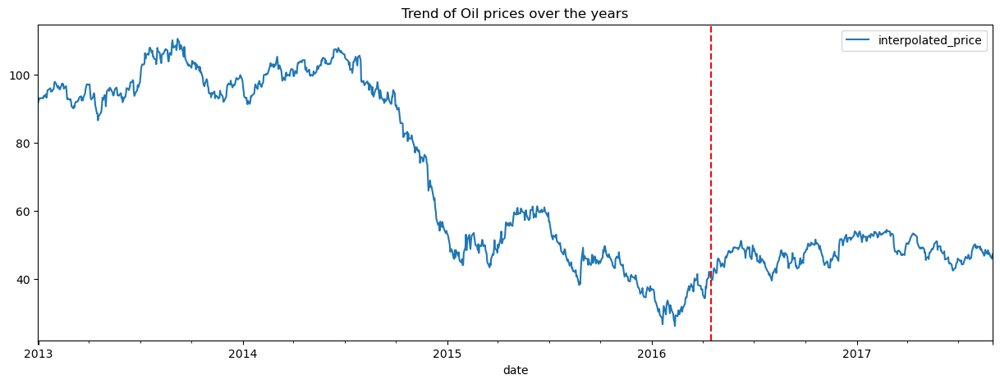

In [92]:
ax = oil_df.plot('date', 'interpolated_price', title='Trend of Oil prices over the years', figsize=(15,5))
ax.axvline(earthquake, color='red', linestyle='--')

The oil price droppped before 2015 this could have had an impact on sales after some time. The effect from the oil price changes might effect sales after a day, week, or even a month thus, I'll add moving average values to see the effects of the average prices on sales through a correlation plot or feature importance plot.

In [93]:
oil_df['price_lag(1)'] = oil_df['interpolated_price'].shift()
oil_df['price_lag_mean(5)'] = oil_df['interpolated_price'].rolling(5).mean()
oil_df['price_lag_mean(10)'] = oil_df['interpolated_price'].rolling(10).mean()

In [94]:
oil_df['per_difference'] = (oil_df['price_lag(1)'] - oil_df['interpolated_price']) / oil_df['price_lag(1)']

In [95]:
final_oil = oil_df.dropna(subset=['price_lag_mean(10)'])

In [96]:
final_oil.head()

,date,dcoilwtico,interpolated_price,price_lag(1),price_lag_mean(5),price_lag_mean(10),per_difference
6,2013-01-09,93.08,93.080000,93.210000,93.162000,92.935500,0.001395
7,2013-01-10,93.81,93.810000,93.080000,93.294667,93.133500,-0.007843
8,2013-01-11,93.60,93.600000,93.810000,93.380000,93.245000,0.002239
2,2013-01-12,NaN,93.823333,93.600000,93.504667,93.313333,-0.002386
3,2013-01-13,NaN,94.046667,93.823333,93.672000,93.421000,-0.002380


In [97]:
final_oil = final_oil.drop(columns=['dcoilwtico'])

In [98]:
data_w_oil = store_data.merge(final_oil, how='left', on='date')

In [99]:
data_w_oil.head()

,date,store_nbr,family,sales,onpromotion,month,day_of_month,day_of_year,week_of_year,day_of_week,...,earthquake_impact,city,state,type,cluster,interpolated_price,price_lag(1),price_lag_mean(5),price_lag_mean(10),per_difference
0,2013-01-01,1,AUTOMOTIVE,0.0,0.0,1,1,1,1,1,...,0,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN
1,2013-01-01,1,BABY CARE,0.0,0.0,1,1,1,1,1,...,0,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN
2,2013-01-01,1,BEAUTY,0.0,0.0,1,1,1,1,1,...,0,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN
3,2013-01-01,1,BEVERAGES,0.0,0.0,1,1,1,1,1,...,0,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN
4,2013-01-01,1,BOOKS,0.0,0.0,1,1,1,1,1,...,0,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN


#### Holiday

In [100]:
holiday.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [101]:
holiday.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB


In [102]:
holiday.date.max()

'2017-12-26'

In [103]:
holiday.rename(columns={'type': 'holiday_type'}, inplace=True)

In [104]:
holiday['date'] = pd.to_datetime(holiday['date'])

In [105]:
all_data = data_w_oil.merge(holiday, how='left', on=['date'])

In [106]:
all_data.head()

,date,store_nbr,family,sales,onpromotion,month,day_of_month,day_of_year,week_of_year,day_of_week,...,interpolated_price,price_lag(1),price_lag_mean(5),price_lag_mean(10),per_difference,holiday_type,locale,locale_name,description,transferred
0,2013-01-01,1,AUTOMOTIVE,0.0,0.0,1,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Primer dia del ano,False
1,2013-01-01,1,BABY CARE,0.0,0.0,1,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Primer dia del ano,False
2,2013-01-01,1,BEAUTY,0.0,0.0,1,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Primer dia del ano,False
3,2013-01-01,1,BEVERAGES,0.0,0.0,1,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Primer dia del ano,False
4,2013-01-01,1,BOOKS,0.0,0.0,1,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Primer dia del ano,False


In [107]:
all_data.holiday_type.unique()

array(['Holiday', nan, 'Work Day', 'Additional', 'Event', 'Transfer',
       'Bridge'], dtype=object)

In [108]:
def dayType(row):
    # Denote work days and holidays for days that were not holidays
    if row.holiday_type is np.NaN: 
        if row.is_weekend == 0:
            return 'Workday'
        else:
            return 'No Work'
    # Denote special days
    elif row.holiday_type == 'Transfer' or row.holiday_type == 'Additional' or row.holiday_type == 'Bridge' or row.holiday_type == 'Event':
        return 'Special'
    # Rename work days
    elif row.holiday_type == 'Work Day':
        return 'Workday'
    # Add transferred holidays to special days
    elif row.transferred:
        return 'Special'
    else:
        return row.holiday_type

In [109]:
all_data['day_type'] = all_data.apply(dayType, axis=1)

In [136]:
all_data['day_type'].head()

14256    Workday
14257    Workday
14258    Workday
14259    Workday
14260    Workday
Name: day_type, dtype: object

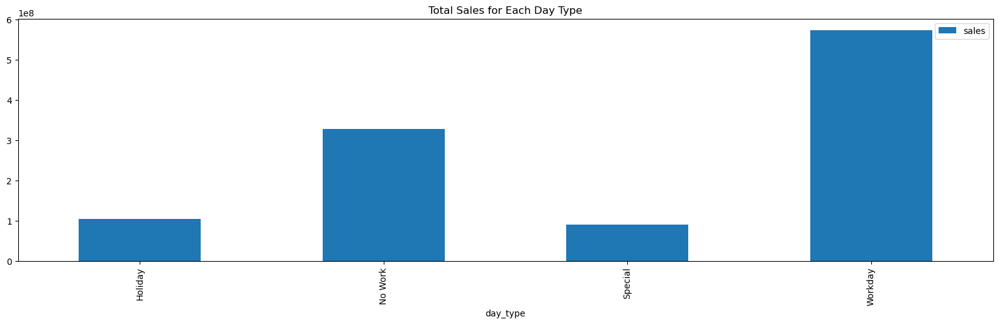

In [110]:
# Total Sales for each work day type
ax = all_data.groupby(['day_type'], as_index=False)['sales'].sum()\
                                    .plot('day_type', 'sales', kind='bar', figsize=(20,5),
                                         title='Total Sales for Each Day Type')

In [112]:
all_data.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068604 entries, 0 to 3068603
Data columns (total 37 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   date                3068604 non-null  datetime64[ns]
 1   store_nbr           3068604 non-null  int64         
 2   family              3068604 non-null  object        
 3   sales               3068604 non-null  float64       
 4   onpromotion         3068604 non-null  float64       
 5   month               3068604 non-null  int64         
 6   day_of_month        3068604 non-null  int64         
 7   day_of_year         3068604 non-null  int64         
 8   week_of_year        3068604 non-null  UInt32        
 9   day_of_week         3068604 non-null  int64         
 10  year                3068604 non-null  int64         
 11  is_weekend          3068604 non-null  int32         
 12  is_month_start      3068604 non-null  int32         
 13  is_month_end

In [113]:
all_data.replace({'locale': {np.nan: 'None'},
                  'locale_name': {np.nan: 'None'},
                  'transferred': {np.nan: False}}, inplace=True)

In [114]:
all_data.dropna(subset=['price_lag_mean(10)'], inplace=True)

In [126]:
all_data["locale_name"].unique()

array(['None', 'Ecuador', 'Manta', 'Cotopaxi', 'Cuenca', 'Libertad',
       'Riobamba', 'Puyo', 'Guaranda', 'Imbabura', 'Machala', 'Latacunga',
       'El Carmen', 'Santo Domingo', 'Cayambe', 'Guayaquil', 'Esmeraldas',
       'Ambato', 'Ibarra', 'Quevedo', 'Santo Domingo de los Tsachilas',
       'Santa Elena', 'Quito', 'Loja', 'Salinas'], dtype=object)

In [117]:
cols = ['family', 'city', 'state', 'type', 'locale', 'locale_name', 'day_type', 'transferred']

for col in cols:
    ohe = OneHotEncoder(drop = 'first', sparse=False)
    all_data[col] = ohe.fit_transform([all_data[col]])

ValueError: Length of values (1) does not match length of index (3054348)

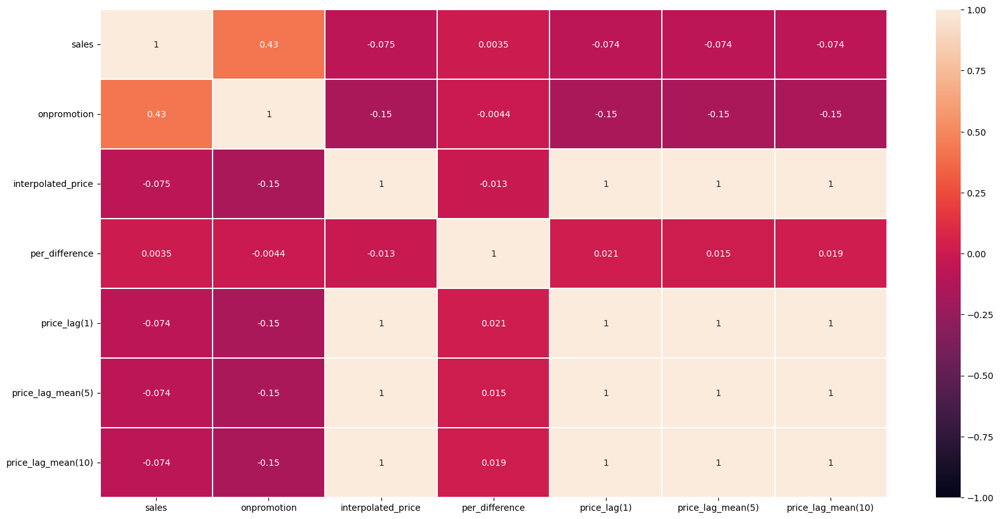

In [119]:
# Correlation for numeric and boolean columns
numeric_cols = ['sales', 'onpromotion', 'interpolated_price', 'per_difference', 'price_lag(1)', 
                'price_lag_mean(5)', 'price_lag_mean(10)']
plt.figure(figsize=(20, 10))
ax = sns.heatmap(all_data[numeric_cols].corr(), linewidths=0.1, vmin=-1, vmax=1, annot=True)

Check correlation between numerical values to see any relationships between columns.

Most of the columns have a weak correlation with each other but the correlation might still be enough to help with the forecast.

In [ ]:
drop_columns = ['sales', 'date', 'description', 'holiday_type']

In [ ]:
Xtrain = all_data.drop(columns=drop_columns).values
ytrain = all_data.sales.values

### Model Building

#### Baseline model
Since most of the sales are affected by a lot of categorical fields, various tree-based models can be applied to achieve optimal results. Thus, I'll use a <b>Decision Tree</b> as my baseline model. The model would also be used to show the most relevant features.

#### Other models that can be used

* <b>Random Forest</b>
* <b>XGBoost</b>
* <b>Light GBM</b>

Since I'm using tree based algorithms feature scaling is not important since the data is divided and treated differently, thus I'm going to skip any feature scaling steps.

#### Decision Tree

In [ ]:
decision_tree = DecisionTreeRegressor()

In [ ]:
decision_tree_model = decision_tree.fit(Xtrain, ytrain)

<BarContainer object of 33 artists>

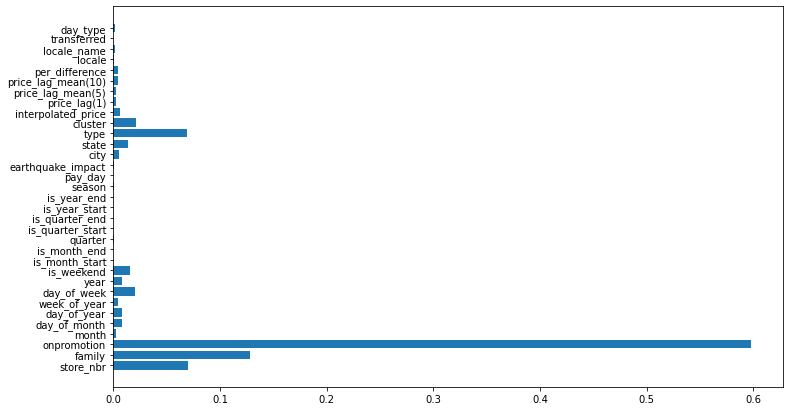

In [ ]:
plt.figure(figsize=(12,7))
plt.barh(all_data.drop(columns=drop_columns).columns, decision_tree_model.feature_importances_)

##### According to the model, the most important features for the regression are onpromotion, family, store_nbr.

But these results are based on an evaluation with the RMSE.

Disadvantage of model choice:

* Can not specify RMSLE as evaluation metric.

To combat this and also get a sense of the model performance I'll use a backtest for cross validation.

In [ ]:
print(f'Min Date: {all_data.date.dt.date.min()}, Max Date: {all_data.date.dt.date.max()}')

Min Date: 2013-01-09, Max Date: 2017-08-15


#### Backtests To Test Model before submission

The backtest is simply a cross validation method that involves filtering out data from the training set and using the model to predict and score it to get an idea of the performance before picking the final model. 

The backtest here would be run on 3 periods with 15 days of data reserved for testing.

* Backtest 1 - Train with data from 2013-01-09 to 2017-06-30, Test on data from 2017-07-01 to 2017-07-15
* Backtest 2 - Train with data from 2013-01-09 to 2017-07-14, Test on data from 2017-07-15 to 2017-07-30
* Backtest 3 - Train with data from 2013-01-09 to 2017-07-31, Test on data from 2017-08-01 to 2017-08-15

In [ ]:
backtests = {
    1: ('2017-07-01', '2017-07-15'),
    2: ('2017-07-15', '2017-07-30'),
    3: ('2017-08-01', '2017-08-15')
}

In [ ]:
# Backtests with Decision Tree
scores = {}

for idx, period in enumerate(backtests):
    decision_tree = DecisionTreeRegressor()
    
    _train = all_data[all_data['date'] < backtests[period][0]]
    _test = all_data[(all_data['date'] >= backtests[period][0]) & (all_data['date'] <= backtests[period][1])]
    
    Xtrain, ytrain = _train.drop(columns=drop_columns).values, _train.sales.values
    Xtest, ytest = _test.drop(columns=drop_columns).values, _test.sales.values
    
    decision_tree_model = decision_tree.fit(Xtrain, ytrain)
    
    ypred = decision_tree_model.predict(Xtest)
    
    scores[period] = np.sqrt(msle(ytest, ypred))

In [ ]:
print(scores)

{1: 0.36760939137012605, 2: 0.37979674667011315, 3: 0.37810620700052616}


From the backtest the evaluation scores are not bad, but the evaluation method penalises more for underestimation than overestimation. This makes it safe to assume that the model probably had fewer incidents of underestimation and can be applied in it's raw state.

Further steps that can be taken to improve the model:

* Use a model that allows the use custom evaluation metric or even just RMSLE.
* Use backtest method to tune the hyperparameters for an optimal or consistent results.

#### Testing the model and producing final output

In [ ]:
def prepareTestData(df, final_oil):
    test_df = getDateFeatures(df, 'date')
    test_df['season'] = np.where(test_df['month'].isin([6,7,8,9]), 1, 0)
    test_df['pay_day'] = np.where(test_df['date'].isin(pay_day), 1, 0)
    test_df['earthquake_impact'] = 0
    store_data = test_df.merge(stores, how='left', on=['store_nbr'])
    data_w_oil = store_data.merge(final_oil, how='left', on='date')
    all_data = data_w_oil.merge(holiday, how='left', on=['date'])
    all_data['day_type'] = all_data.apply(dayType, axis=1)
    all_data.replace({'locale': {np.nan: 'None'},
                  'locale_name': {np.nan: 'None'},
                  'transferred': {np.nan: False}}, inplace=True)
    cols = ['family', 'city', 'state', 'type', 'locale', 'locale_name', 'day_type', 'transferred']

    for col in cols:
        all_data[col] = LabelEncoder().fit_transform(all_data[col])
    
    return all_data

In [ ]:
test_data = prepareTestData(test, final_oil)

In [ ]:
test_drop_columns = ['id', 'date', 'description', 'holiday_type']

In [ ]:
y_test = test_data.drop(columns=test_drop_columns)

In [ ]:
predicted_values = decision_tree_model.predict(y_test)

In [ ]:
test_data['sales'] = predicted_values

In [ ]:
# Save sample submission
test_data[['id', 'sales']].to_csv('submission.csv', index=False)